# Lead Poisoning in Children in NYC Neighbourhoods

Arnold Institute Data Challenge, March 14, 2016, Karen Smith.

For this data challenge, I chose to examine whether neighbourhood-level lead poisoning risk (based on the NYC Lead Poisoning, 2012, report) could be predicted using zipcode-level data from the American Community Survey, 2014. 

In an accompanying IPython Notebook, I have done a similar analysis at the county-level in New York State. 

The results are summarized in a blog that can be found at: 

In [42]:
#load packages
import pandas as pd
from pandas import Series
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set(style='whitegrid',context='notebook')
import numpy as np
%matplotlib inline
mpl.rc('font',size=12,weight='bold') #set default font size and weight for plots
rootpath = '/Users/Karen/Documents/lead_poisoning/data/'

In [3]:
#Read in NYC Neighbourhood data (neighbourhoods corresponding to the United Hospital Fund)

#This data was copy and pasted from the NYC Lead Poisoning Report, 2012, into a .csv file, 
#so it needs to be cleaned up a bit

data = pd.read_csv(rootpath + 'NYC_neighbourhoodsCSV.csv')

In [4]:
#neighbourhood names
hoods = data.iloc[0:42,1]

In [5]:
#zipcodes within each neighbourhood
zipcodes = data.iloc[43:,1]
zipcodes = zipcodes.str.split(' ').apply(Series, 1).stack()

In [6]:
hoods.reset_index(drop=True)

0                 BX1 Kingsbridge­Riverdale
1                       BX2 Northeast Bronx
2                    BX3 Fordham­Bronx Park
3                    BX4 Pelham­Throgs Neck
4                       BX5 Crotona­Tremont
5                BX6 High Bridge­Morrisania
6                BX7 Hunts Point­Mott Haven
7                            BK1 Greenpoint
8                 BK2 Williamsburg­Bushwick
9           BK3 Downtown­Heights­Park Slope
10     BK4 Bedford Stuyvesant­Crown Heights
11                        BK5 East New York
12                          BK6 Sunset Park
13                         BK7 Borough Park
14               BK8 East Flatbush­Flatbush
15                   BK9 Canarsie­Flatlands
16               BK10 Bensonhurst­Bay Ridge
17         BK11 Coney Island­Sheepshead Bay
18             M1 Washington Heights­Inwood
19    M2 Central Harlem­Morningside Heights
20                           M3 East Harlem
21                       M4 Upper West Side
22                       M5 Uppe

In [7]:
zipcodes.reset_index(drop=True)

0                                           10463,10471
1                         10466,10469,10470,10475,10803
2                                     10458,10467,10468
3                   10461,10462,10464,10465,10472,10473
4                                     10453,10457,10460
5                                     10451,10452,10456
6                               10454,10455,10459,10474
7                                           11211,11222
8                                     11206,11221,11237
9             11201,11202,11205,11215,11217,11231,11251
10                        11212,11213,11216,11233,11238
11                                          11207,11208
12                                          11220,11232
13                              11204,11218,11219,11230
14                              11203,11210,11225,11226
15                                    11234,11236,11239
16                              11209,11214,11228,11252
17                              11223,11224,1122

In [9]:
#Create a list of all zipcodes
allzips = []
for i in range(len(zipcodes)):
    zclist = zipcodes[i].split(',')
    for zc in zclist:
        allzips.append(zc)

In [10]:
#Create a list of each neighbourhood corresponding to the above list of zipcodes
allhoods = []
for i in range(len(hoods)):
    zclist = zipcodes[i].split(',')
    for j in range(len(zclist)):
        hoodlist = hoods[i].split(' ')
        allhoods.append(hoodlist[0])

In [11]:
#Combine Neighbourhoods and zipcodes into one new dataframe
allzipsdf = pd.DataFrame(allzips,columns=["ZipCode"])
allhoodsdf = pd.DataFrame(allhoods,columns=["Neighborhood"])
newdata = pd.concat([allhoodsdf,allzipsdf],axis=1)

newdata.head()

,Neighborhood,ZipCode
0,BX1,10463
1,BX1,10471
2,BX2,10466
3,BX2,10469
4,BX2,10470


In [12]:
#Save data to csv in order to add the BLL data (by hand - I tried to install pdfquery but to do this but 
#couldn't get it to install and didn't have time to figure out why.)
newdata.to_csv(rootpath + 'NYC_neighbourhoodsCSV_reformat.csv')

In [13]:
#Read in NYC Neighbourhood data now with BLLs for Children under 18 from NYC Lead Poisoning Report, 2012 & 2009
BLLdata = pd.read_csv(rootpath + 'NYC_neighbourhoodsCSV_BLLs.csv')

In [15]:
#Remove index redundant index column
BLLdata = BLLdata.iloc[:,1:]

# Assumption 1:  Uniformity between Neighbourhood-level and zipcode-level BLL case rates
Since we don't have zipcode-level BLL data (and we will be using zipcode-level census data), we assume that the BLL case rate is the same in each zipcode within the neighbourhood. This is likely not the best assumption, but given that we do not have more granular BLL data, this is the assumption that we will make going forward. 

Note: I have also put the same number of cases in each zipcode but, for this is just a place holder. The rate is
what we will use to make our prediction of lead poisoning risk (see below).

In [16]:
BLLdata.head()

,Neighborhood,ZipCode,New Cases (2012),New Rate (2012),EIBLL Cases (2010-2012),EIBLL Rate (2010-2012),Past Rate (2009),Past EIBLL Rate (2009)
0,BX1,10463,6,1.5,6,0.50,2.3,0.26
1,BX1,10471,6,1.5,6,0.50,2.3,0.26
2,BX2,10466,20,2.5,29,1.12,2.6,1.27
3,BX2,10469,20,2.5,29,1.12,2.6,1.27
4,BX2,10470,20,2.5,29,1.12,2.6,1.27


In [17]:
BLLdata.describe()

,ZipCode,New Cases (2012),New Rate (2012),EIBLL Cases (2010-2012),EIBLL Rate (2010-2012),Past Rate (2009),Past EIBLL Rate (2009)
count,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000
mean,10831.580808,25.358586,2.389394,33.045455,0.892778,3.723232,1.073030
std,574.745047,20.665519,1.261793,31.873209,0.380436,1.590315,0.577616
min,10001.000000,1.000000,0.200000,2.000000,0.260000,1.800000,0.000000
25%,10302.250000,12.250000,1.800000,11.000000,0.570000,2.700000,0.770000
50%,11201.500000,21.000000,2.300000,24.000000,0.850000,3.450000,1.100000
75%,11361.750000,39.000000,2.800000,50.250000,1.120000,4.300000,1.490000
max,11697.000000,102.000000,11.400000,140.000000,1.940000,12.700000,2.730000


In [24]:
len(BLLdata['New Rate (2012)'])

198

BLL Rate Median is: 2.3
EIBLL Rate Median is: 0.85


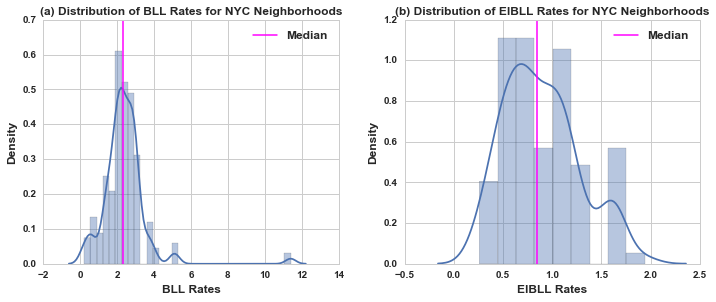

In [113]:
#What are the medians of the BLL and EIBLL rates?
BLLratemed = BLLdata['New Rate (2012)'].median()
print "BLL Rate Median is:", BLLratemed
EIBLLratemed = BLLdata['EIBLL Rate (2010-2012)'].median()
print "EIBLL Rate Median is:", EIBLLratemed

#Plot probability density curves of BLL Rates and EIBLL Rates
fig = plt.figure(figsize=(12,24)) #define figure size
ax1 = plt.subplot2grid((6,12),(0,0),colspan=5) #define location of subplots

ax1 = sns.distplot(BLLdata['New Rate (2012)'])
ax1.set_xlabel('BLL Rates',fontsize=12,fontweight='bold')
ax1.set_ylabel('Density',fontsize=12,fontweight='bold')
ax1.set_title('(a) Distribution of BLL Rates for NYC Neighborhoods',fontsize=12,fontweight='bold')
ax1.plot(np.squeeze(BLLratemed*np.ones(len(BLLdata['New Rate (2012)']))),\
         np.linspace(0,0.7,len(BLLdata['New Rate (2012)'])),'magenta',label='Median',linewidth=1.5)
ax1.legend(loc='upper right',fontsize=12)

ax2 = plt.subplot2grid((6,12),(0,5),colspan=5)
ax2 = sns.distplot(BLLdata['EIBLL Rate (2010-2012)'])
ax2.set_xlabel('EIBLL Rates',fontsize=12,fontweight='bold')
ax2.set_ylabel('Density',fontsize=12,fontweight='bold')
ax2.set_title('(b) Distribution of EIBLL Rates for NYC Neighborhoods',fontsize=12,fontweight='bold')
ax2.plot(np.squeeze(EIBLLratemed*np.ones(len(BLLdata['New Rate (2012)']))),\
         np.linspace(0,1.2,len(BLLdata['New Rate (2012)'])),'magenta',label='Median',linewidth=1.5)
ax2.legend(loc='upper right',fontsize=12)

plt.tight_layout()
plt.savefig('NYCBLLhists.png',dpi=600,bbox_inches='tight')

# Assumption 2: BLL Case Rate Threshold
In order to identify NYC neighborhoods that are at risk of greater lead poisoning, we assume that the median BLL Rate is a good threshold for classification, i.e. a community is at less risk if its BLL Rate is below the median (class 0) and a community is at a greater risk if its BLL Rate is below the median (class 1). Using the median gives me balanced classes.

I have also created a second classification based on the median EIBLL Rate, for comparison.

In [47]:
#create new class variables (denoted "Lead Risk" and "Serious Lead Risk" for each zipcode)
BLLdata.ix[BLLdata['New Rate (2012)']>=2.3, 'Lead Risk'] = 1
BLLdata.ix[BLLdata['New Rate (2012)']<2.3, 'Lead Risk'] = 0

BLLdata.ix[BLLdata['EIBLL Rate (2010-2012)']>=0.85, 'Serious Lead Risk'] = 1
BLLdata.ix[BLLdata['EIBLL Rate (2010-2012)']<0.85, 'Serious Lead Risk'] = 0

In [48]:
BLLdata.head()

,Neighborhood,ZipCode,New Cases (2012),New Rate (2012),EIBLL Cases (2010-2012),EIBLL Rate (2010-2012),Past Rate (2009),Past EIBLL Rate (2009),Lead Risk,Serious Lead Risk
0,BX1,10463,6,1.5,6,0.50,2.3,0.26,0,0
1,BX1,10471,6,1.5,6,0.50,2.3,0.26,0,0
2,BX2,10466,20,2.5,29,1.12,2.6,1.27,1,1
3,BX2,10469,20,2.5,29,1.12,2.6,1.27,1,1
4,BX2,10470,20,2.5,29,1.12,2.6,1.27,1,1


# Assumption 3: Features for the prediction model
Now we will incorporate zipcode-level data from the American Community Survey (ACS), 2014. The data from the survey covers the years 2010-2014. For the purposes of this analysis, we will assume that this data adequately captures the important characteristics of each zipcode even though it may not reflect the exact statistics for the neighborhood in the year 2012.

In [49]:
#Read in NYC Neighbourhood data from ACS

#data about housing
homedata = pd.read_csv(rootpath + 'homenyc_trunc.csv')

#data about the households
householddata = pd.read_csv(rootpath + 'householdnyc_trunc.csv')

#data about the demograhphics
demodata = pd.read_csv(rootpath + 'demonyc_trunc.csv')

#data about the economics
econdata = pd.read_csv(rootpath + 'econnyc_trunc.csv')

In [50]:
homedata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213 entries, 0 to 212
Data columns (total 22 columns):
esriid                     213 non-null object
TotHUs                     213 non-null object
pctOccHUs                  180 non-null object
pctOwnerOcc                180 non-null object
pctRenterOcc               180 non-null object
AvgOwnerHHSize             179 non-null object
AvgRenterHHSize            180 non-null object
pctVacantForSale           180 non-null object
pctVacantForRent           180 non-null object
pctUnits20up               180 non-null object
pctBuilt1990_1999          180 non-null object
pctBuilt1980_1989          180 non-null object
pctBuilt1970_1979          180 non-null object
pctBuilt1960_1969          180 non-null object
pctBuilt1950_1959          180 non-null object
pctBuilt1940_1949          180 non-null object
pctBuiltBefore1940         180 non-null object
pctPersonsPerRoomLow       180 non-null object
pctPersonsPerRoomMedium    180 non-null object
pc

In [51]:
householddata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213 entries, 0 to 212
Data columns (total 22 columns):
esriid                  213 non-null object
FamsWithKids            213 non-null object
pctFamsWithKids         180 non-null object
pctSingleFathers        180 non-null object
pctSingleMothers        180 non-null object
HHsWithKids             213 non-null object
pctHHsWithKids          180 non-null object
AvgFamSize              180 non-null object
pctLessThan9th          182 non-null object
pctSomeHighSchool       182 non-null object
pctHighSchool           182 non-null object
pctSomeCollege          182 non-null object
pctAssociates           182 non-null object
pctBachelors            182 non-null object
pctGradProf             182 non-null object
pctHighSchoolOrMore     182 non-null object
pctBachelorsormore      182 non-null object
pctVeteran              182 non-null object
pctUSNative             182 non-null object
pctBornInUS             182 non-null object
pctOthLangEngli

In [52]:
demodata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213 entries, 0 to 212
Data columns (total 33 columns):
esriid              213 non-null object
TotPop              213 non-null object
pctAge0_4           182 non-null object
pctAge5_9           182 non-null object
pctAge10_14         182 non-null object
pctAge15_19         182 non-null object
pctAge20_24         182 non-null object
pctAge25_34         182 non-null object
pctAge35_44         182 non-null object
pctAge45_54         182 non-null object
pctAge55_59         182 non-null object
pctAge60_64         182 non-null object
pctAge65_74         182 non-null object
pctAge75_84         182 non-null object
pctOver85           182 non-null object
pctOver5            182 non-null object
pctOver15           182 non-null object
pctUnder18          182 non-null object
pctOver18           182 non-null object
pctOver21           182 non-null object
pctOver25           182 non-null object
pctOver62           182 non-null object
pctOver65      

In [53]:
econdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213 entries, 0 to 212
Data columns (total 43 columns):
esriid                      213 non-null object
pctHHInc0                   180 non-null object
pctHHInc10                  180 non-null object
pctHHInc15                  180 non-null object
pctHHInc25                  180 non-null object
pctHHInc35                  180 non-null object
pctHHInc50                  180 non-null object
pctHHInc75                  180 non-null object
pctHHInc100                 180 non-null object
pctHHInc150                 180 non-null object
pctHHInc200                 180 non-null object
pctNumHHEarnings            180 non-null object
pctNumHHPubAssist           180 non-null object
pctNumHHFoodStmp            180 non-null object
MedianHHInc                 180 non-null object
AvgHHInc                    180 non-null object
pctFamHHs                   180 non-null object
pctFamHHInc0                180 non-null object
pctFamHHInc10               180

In [54]:
#the number of zipcodes (i.e., rows) are not the same in the ACS dataframes as the BLL dataframe, meaning
#that they do not have all the same zipcodes in common.
print "Number of rows in homedata:", len(homedata)
print "Number of rows in householddata:", len(householddata)
print "Number of rows in demodata:", len(demodata)
print "Number of rows in econdata:", len(econdata)
print "Number of rows in BLLdata:", len(BLLdata)
homedata = homedata.rename(columns={'esriid': 'ZipCode'})
householddata = householddata.rename(columns={'esriid': 'ZipCode'})
demodata = demodata.rename(columns={'esriid': 'ZipCode'})
econdata = econdata.rename(columns={'esriid': 'ZipCode'})
BLLdata['ZipCode'] = BLLdata['ZipCode'].astype(str)

#Let's restrict our analysis to the zipcodes in common
#So, we merge data sets based on zipcode (i.e., find the intersection)
zipmerge = pd.merge(BLLdata,homedata,how='inner',on=['ZipCode'])
zipmerge = pd.merge(zipmerge,householddata,how='inner',on=['ZipCode'])
zipmerge = pd.merge(zipmerge,demodata,how='inner',on=['ZipCode'])
zipmerge = pd.merge(zipmerge,econdata,how='inner',on=['ZipCode'])
print "Number of rows in merged dataframe:", len(zipmerge)

Number of rows in homedata: 213
Number of rows in householddata: 213
Number of rows in demodata: 213
Number of rows in econdata: 213
Number of rows in BLLdata: 198
Number of rows in merged dataframe: 186


In [55]:
zipmerge.head()

,Neighborhood,ZipCode,New Cases (2012),New Rate (2012),EIBLL Cases (2010-2012),EIBLL Rate (2010-2012),Past Rate (2009),Past EIBLL Rate (2009),Lead Risk,Serious Lead Risk,...,MedianEarningsFemale,pctPoor,pctPoorUnder18,pctPoor18to64,pctPoorOver65,LaborForce,pctOwnKidsU6AllPrntsWk,pctOwnKidsO6AllPrntsWk,pctNotInsuredUnder65,pctNotInsuredUnder18
0,BX1,10463,6,1.5,6,0.50,2.3,0.26,0,0,...,49624.00,18.00,25.70,16.40,13.30,35702.00,73.90,76.60,12.80,3.30
1,BX1,10471,6,1.5,6,0.50,2.3,0.26,0,0,...,69080.00,9.30,8.60,9.20,10.10,10703.00,68.80,73.50,7.40,3.90
2,BX2,10466,20,2.5,29,1.12,2.6,1.27,1,1,...,38423.00,21.60,31.00,18.20,19.50,33987.00,67.30,75.40,14.30,4.30
3,BX2,10469,20,2.5,29,1.12,2.6,1.27,1,1,...,41909.00,13.20,19.00,11.60,9.90,36213.00,79.10,77.30,11.90,4.00
4,BX2,10470,20,2.5,29,1.12,2.6,1.27,1,1,...,46658.00,12.20,18.70,10.40,10.30,8037.00,80.70,73.70,16.30,4.20


In [56]:
#what zipcodes did we lose?
UHFzip = BLLdata['ZipCode']
ACSzip = homedata['ZipCode']
zipnotmerged = UHFzip[~UHFzip.isin(ACSzip)]
print "These are the zipcodes that were not in our original UHF BLL dataset:\n"
print zipnotmerged.values, "\n"
print "Some are outside of the city, some are parks, one is the naval yard"

These are the zipcodes that were not in our original UHF BLL dataset:

['10803' '11202' '11251' '11252' '10048' '10281' '11352' '11431' '11001'
 '11040' '11695' '10313'] 

Some are outside of the city, some are parks, one is the naval yard


In [57]:
#In order to calculate correlations between all of our features, we need to make sure that they are all numbers
#and not string. Do a quick type conversion.
for i in range(8,len(zipmerge.columns)):
    zipmerge[zipmerge.columns[i]] = zipmerge[zipmerge.columns[i]].astype(float)

How many rows do we have left after dropping NaNs?: 176


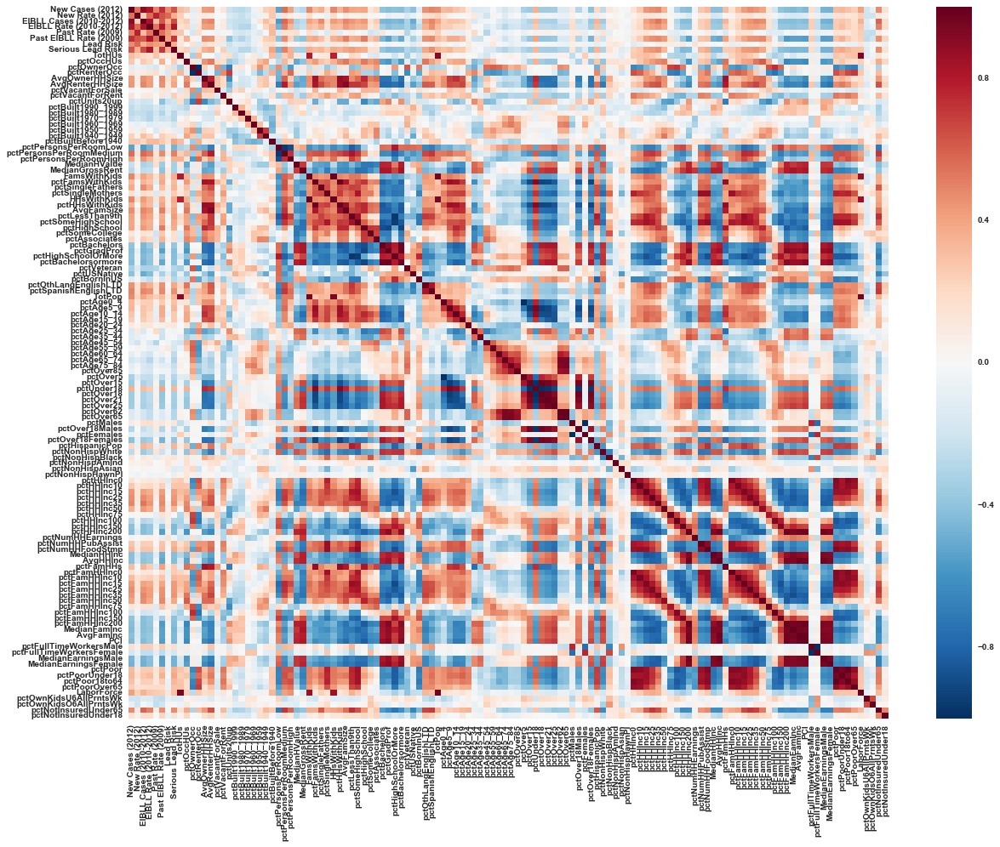

In [58]:
#Feature correlations:
#Note that "Lead Risk" and "Serious Lead Risk" are not highly correlated, indicating the different features may be
#important for predicting these two separate classes of lead poisoning.

#The ACS data has some missing values:
#For now we will drop NaNs, but we will come back to this and perhaps try imputing based on characteristics of other
#zipcodes in the same UHF neighbourhood
zipmerge_dropna = zipmerge.dropna()
print "How many rows do we have left after dropping NaNs?:", len(zipmerge_dropna)
plt.figure(figsize=(20,15))
corr1 = sns.heatmap(zipmerge_dropna.corr())

The % Dwellings Built Before 1940 Median is: 37.3


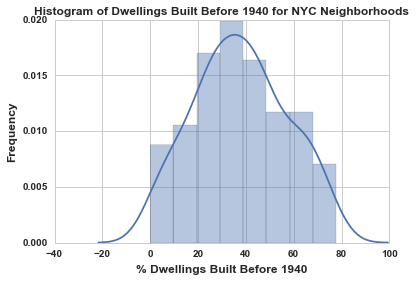

In [59]:
#plot histogram of % Dwellings Built Before 1940
sns.distplot(zipmerge_dropna['pctBuiltBefore1940'])
plt.xlabel('% Dwellings Built Before 1940',fontsize=12,fontweight='bold')
plt.ylabel('Frequency',fontsize=12,fontweight='bold')
plt.title('Histogram of Dwellings Built Before 1940 for NYC Neighborhoods',fontsize=12,fontweight='bold')
pctBB1940med = zipmerge_dropna['pctBuiltBefore1940'].median()
print "The % Dwellings Built Before 1940 Median is:", pctBB1940med

The Median Housing Value Median is: 485400.0


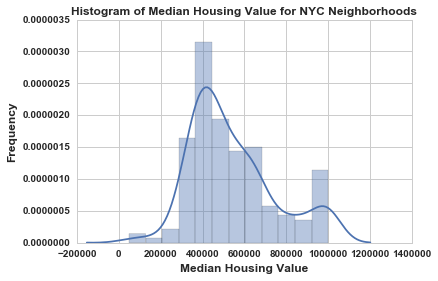

In [60]:
#plot histogram of % Dwellings Built Before 1940
sns.distplot(zipmerge_dropna['MedianHValue'])
plt.xlabel('Median Housing Value',fontsize=12,fontweight='bold')
plt.ylabel('Frequency',fontsize=12,fontweight='bold')
plt.title('Histogram of Median Housing Value for NYC Neighborhoods',fontsize=12,fontweight='bold')
pctMHVmed = zipmerge_dropna['MedianHValue'].median()
print "The Median Housing Value Median is:", pctMHVmed

# Now we will train a classification model
Many of the features above are highly correlated. We will start with a logistic regression model with L1-regularization to reduce the number of features. 

We will start by trying to classify "Serious Lead Risk", based on EIBLL rates (BLL greater than 15), and then move to "Lead Risk", based on BLL rates (BLL greater than 10).

In [99]:
#Separate input and output data
outputLR = zipmerge_dropna['Lead Risk'] #"Lead Risk"
outputSLR = zipmerge_dropna['Serious Lead Risk'] #"Serious Lead Risk"

#Use only ACS features that have no specific lead information.
#We will also try adding BLL information from the NYC Lead Poisoning Report, 2009. 

#These are different feature sets that I tested

#features = zipmerge_dropna.iloc[:,6:8] #only 2009 BLL and EIBLL rate data
#features = zipmerge_dropna.iloc[:,10:] #only ACS data
features = pd.concat((zipmerge_dropna.iloc[:,6:8],zipmerge_dropna.iloc[:,10:]),axis=1) #ACS + 2009 BLL and EIBLL data
print "The number of features is:", len(features.columns)

The number of features is: 118


In [100]:
#Since we are going to use regularization, we need to scale the data
from sklearn.preprocessing import StandardScaler

scale_inst = StandardScaler().fit(features)
features_scale = scale_inst.transform(features)

In [101]:
#Split data into training and testing using sklearn cross-validation (70% training/30% testing data)

#Start with "Serious Lead Risk" as output
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(np.asarray(features_scale),\
                                     np.asarray(outputSLR), test_size=0.3,random_state=9)

In [102]:
from sklearn.linear_model import LogisticRegression
from sklearn import cross_validation
from sklearn import metrics
from sklearn.cross_validation import KFold

model = LogisticRegression(penalty='l1')


#use 10-fold cross-validation to test robustness of L1 regularization and accuracy score
cvn = 10
k = 0
coeffs = np.zeros((cvn,len(features.columns)))
accuracy_score = np.zeros((cvn))
kf = KFold(len(y_train), n_folds=cvn)
for train_index, test_index in kf:
    X_train_cv = np.zeros((len(train_index),len(features.columns)))
    y_train_cv = np.zeros((len(train_index)))
    X_test_cv = np.zeros((len(test_index),len(features.columns)))
    y_test_cv = np.zeros((len(test_index)))
    for i in range(len(train_index)):
        X_train_cv[i,:] = X_train[train_index[i],:]
        y_train_cv[i] =  y_train[train_index[i]]
    for j in range(len(test_index)):
        X_test_cv[j,:] = X_train[test_index[j],:]
        y_test_cv[j] = y_train[test_index[j]]
    predicted = model.fit(X_train_cv,y_train_cv).predict(X_test_cv)
    expected = y_test_cv
    accuracy_score[k] = metrics.accuracy_score(expected,predicted)
    coeffs[k,:] = model.coef_
    k = k + 1

print "Testing data metrics:"
mean_scores = np.mean(accuracy_score)
print 
print "Mean cross-validated accuracy score = ", mean_scores

Testing data metrics:

Mean cross-validated accuracy score =  0.885897435897


# Our prediction is pretty good given the assumptions we have made above.
Now we have a model that helps us identify NYC zipcodes that are at higher risk of childhood lead poisoning. I also tried other classifier models (Random Forest, Gradient Boosting and Support Vector Machines), but the Logistic regression with L1-regularization performed the best. With more time, it's possible that tuning these other models
and performing feature selection might improve their performance, but for the purposes of this data challenge, I have opted to stick with Logistic Regression.

Now, let's refine our model logistic regression model a bit further

In [103]:
#Since we used 10-fold cross-validation, we can examine which features all of the training set models have in-common
mask = np.zeros((1,coeffs.shape[1]))
coeffstmp = np.zeros((1,coeffs.shape[1]))
indices = []
l1coeffs=[]
for i in range(coeffs.shape[0]):
    coeffstmp[:] = coeffs[i,:]
    mask = np.all(np.equal(coeffstmp, 0), axis=0)
    l1coeffs.append(coeffstmp[:,~mask])
    
    index = np.where(coeffs[i,:] != 0)
    indices.append(index)

print "These are the features for each of the 10 training set models:\n"
indices

These are the features for each of the 10 training set models:



[(array([  1,  10,  17,  21,  39,  40,  45,  48,  51,  52,  57,  58,  67,
          73,  74,  75,  81,  86,  87,  97, 105, 106, 115]),),
 (array([  1,   8,  10,  16,  17,  21,  39,  45,  49,  51,  52,  58,  73,
          74,  80,  81,  86,  98, 115]),),
 (array([  1,  10,  13,  17,  20,  21,  34,  39,  40,  51,  52,  57,  74,
          75,  81,  86,  87, 115]),),
 (array([  1,   6,  10,  13,  17,  21,  25,  39,  40,  49,  51,  52,  57,
          73,  74,  75,  81,  86, 106, 115]),),
 (array([  1,  16,  17,  21,  34,  39,  40,  49,  51,  52,  54,  57,  66,
          68,  73,  74,  75,  86, 115]),),
 (array([  1,  10,  17,  21,  39,  40,  49,  51,  52,  57,  73,  74,  75,
          86, 115]),),
 (array([ 1,  6, 13, 17, 21, 34, 39, 40, 49, 51, 52, 57, 73, 74, 75, 81, 86]),),
 (array([  1,  10,  17,  21,  39,  40,  49,  51,  52,  57,  73,  74,  75,
          86,  87,  97, 115]),),
 (array([  1,  10,  17,  21,  34,  40,  51,  53,  57,  72,  73,  74,  75,
          81,  86,  97, 115]),),
 (a

In [104]:
#Now, we will find the features that are common across each of the 10-training set models
#First, we need to convert tuples in the variable "indices" to something that we can work with
subindex = []
index = []
count = 0
for i in indices:
    for j in i:
        for k in j:
            subindex.append(k)
        #convert to pandas, so I can use the "isin" function
        subindex = pd.Series(subindex)
        if count == 0:
            index = subindex
        else:
            index = index[index.isin(subindex)]
        count+=1
        subindex = []
print "These are the feature indices that are common across the 10 training set models:\n"
print index.values

These are the feature indices that are common across the 10 training set models:

[ 1 17 21 51 74 86]


In [105]:
#Now, identify the features that are in-common
l1feature_names=[]
for i in index:
    l1feature_names.append(features.columns[i])

print "These are the features that are common to all training set models after L1-Regularization:\n",
l1feature_names

These are the features that are common to all training set models after L1-Regularization:


['Past EIBLL Rate (2009)',
 'pctBuiltBefore1940',
 'MedianHValue',
 'pctAge35_44',
 'pctNonHispAsian',
 'pctNumHHEarnings']

In [106]:
#Now, let's compare the features that the training set models have in-common (i.e., the feature intersection) with
#the feature set union. 

#To do this, we take the mean coefficients of all the training set models and mask out any that are zero.
coeffs_mean = np.mean(coeffs,axis=0)

mask = np.equal(coeffs_mean, 0)
l1coeffs_mean = coeffs_mean[~mask]
l1index = np.where(coeffs_mean != 0)

In [107]:
#Now, let's see all of the features in the training set models - there are quite a few!
l1features_mean_names=[]
for i in l1index[0]:
    l1features_mean_names.append(features.columns[i])

print "These are the", len(l1features_mean_names), "mean features for all training set models combined after L1-Regularization:",
l1features_mean_names

These are the 38 mean features for all training set models combined after L1-Regularization:

['Past EIBLL Rate (2009)',
 'AvgOwnerHHSize',
 'pctVacantForSale',
 'pctUnits20up',
 'pctBuilt1970_1979',
 'pctBuilt1940_1949',
 'pctBuiltBefore1940',
 'pctPersonsPerRoomHigh',
 'MedianHValue',
 'pctSingleFathers',
 'pctAssociates',
 'pctVeteran',
 'pctUSNative',
 'pctAge0_4',
 'pctAge15_19',
 'pctAge20_24',
 'pctAge35_44',
 'pctAge45_54',
 'pctAge55_59',
 'pctAge60_64',
 'pctOver85',
 'pctOver5',
 'pctMales',
 'pctOver18Males',
 'pctFemales',
 'pctNonHispBlack',
 'pctNonHispAmInd',
 'pctNonHispAsian',
 'pctNonHispHawnPI',
 'pctHHInc35',
 'pctHHInc50',
 'pctNumHHEarnings',
 'pctNumHHPubAssist',
 'pctFamHHInc50',
 'pctFamHHInc75',
 'pctFullTimeWorkersMale',
 'pctFullTimeWorkersFemale',
 'pctOwnKidsO6AllPrntsWk']

# Now, let's fine-tune the coefficients of the selected features to find the best model using L2-regularization.

We get a better prediction if we use the combination of all features from the training sets (i.e., the union
of the features) rather than the features common to all the previous training sets (i.e.,
the intersection of features). This has been tested but is not included in the notebook.

In [108]:
#We now extract the combination of features from all training set models and scale
l1features = features[l1features_mean_names]
l1scale_inst = StandardScaler().fit(l1features)
l1features_scale = l1scale_inst.transform(l1features)

In [109]:
#We again split the data into training and testing data sets (70/30 split)
X_train, X_test, y_train, y_test = train_test_split(np.asarray(l1features_scale),\
                                     np.asarray(outputSLR), test_size=0.3,random_state=9)

In [110]:
#We now train the model again using L2-regularization to fine-tune the coefficients for better performance
model = LogisticRegression(penalty='l2')

#use 10-fold cross-validation to test robustness of the model
cvn = 10
k = 0
coeffs = np.zeros((cvn,len(l1features.columns)))
accuracy_score = np.zeros((cvn))
kf = KFold(len(y_train), n_folds=cvn)
for train_index, test_index in kf:
    X_train_cv = np.zeros((len(train_index),len(l1features.columns)))
    y_train_cv = np.zeros((len(train_index)))
    X_test_cv = np.zeros((len(test_index),len(l1features.columns)))
    y_test_cv = np.zeros((len(test_index)))
    for i in range(len(train_index)):
        X_train_cv[i,:] = X_train[train_index[i],:]
        y_train_cv[i] =  y_train[train_index[i]]
    for j in range(len(test_index)):
        X_test_cv[j,:] = X_train[test_index[j],:]
        y_test_cv[j] = y_train[test_index[j]]
    predicted = model.fit(X_train_cv,y_train_cv).predict(X_test_cv)
    expected = y_test_cv
    accuracy_score[k] = metrics.accuracy_score(expected,predicted)
    coeffs[k,:] = model.coef_
    k = k + 1

print "Testing data metrics:"
mean_scores1 = np.mean(accuracy_score)
print 
print "Mean cross-validated accuracy score = ", mean_scores1

Testing data metrics:

Mean cross-validated accuracy score =  0.910256410256


In [111]:
#We calculate the mean of the 10-fold cross-validated coefficients.
coeffs_mean = np.mean(coeffs,axis=0)

#Let's sort the mean coefficients for plotting
from operator import itemgetter
coeffs_sorted,features_sorted = zip(*sorted(zip(coeffs_mean,l1features_mean_names),key=itemgetter(0), reverse=False))

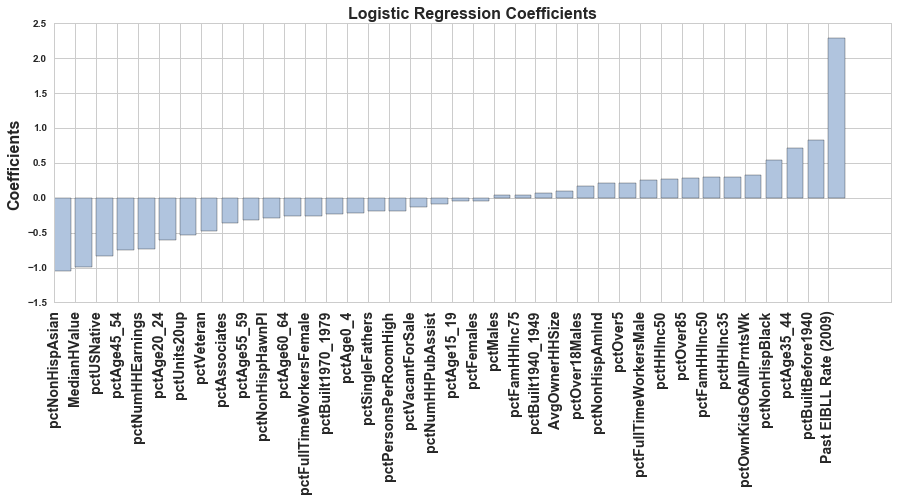

In [112]:
#Plot the sorted regression coefficients
fig = plt.figure(figsize=(15,5)) #define figure size
plt.bar(range(len(features_sorted)), coeffs_sorted, color='lightsteelblue')
plt.xticks(range(len(features_sorted)), features_sorted,fontsize=14,fontweight="bold",rotation='vertical')
plt.ylabel("Coefficients",fontsize=16,fontweight="bold")
plt.title("Logistic Regression Coefficients",fontsize=16,fontweight="bold")
#plt.autoscale()
plt.savefig('NYCFeatImport.png',dpi=600,bbox_inches='tight')

# Features can inform city officials/doctors about which families may be more at risk.

Although the EIBLL case rate data we used for this analysis was very coarse-grained, the features that predict zipcode/neighbourhood-level lead poisoning risk can be used to guide finer-grained testing and monitoring.

Unsurprisingly, past high EIBLL rates and the oldest buildings are associated with the greatest risk. In addition, zipcodes with a greater percentage of individuals age 35-44 (individuals who are at an age when they likely have young children) and a greater percentage of black residents are also associated with higher risk.

The percentage of Asian residents and median housing value in the zipcode are associated with reduced risk.

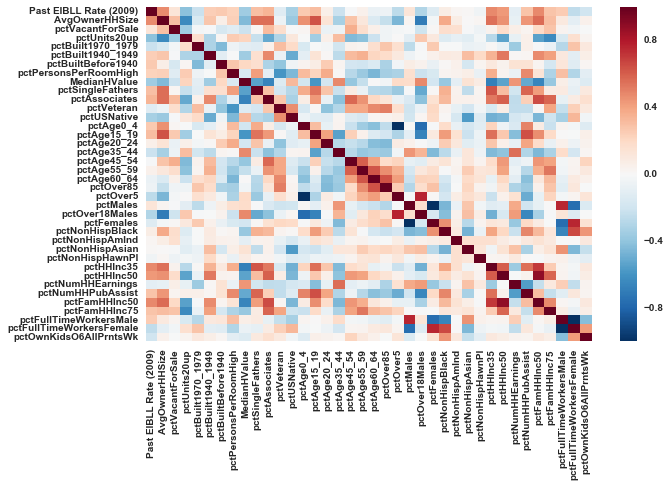

In [89]:
#Let's also look at how correlated our final feature set is. There are a few remaining correlations but 
#the L1-regularization helped us to avoid having many highly-correlated features in our model.

plt.figure(figsize=(10,6))
corr2 = sns.heatmap(l1features.corr())

In [90]:
#Now let's run the model on all the data in order to identify zipcodes that are more at risk
expected = outputSLR
predicted = model.fit(l1features_scale,outputSLR).predict(l1features_scale)

print "Testing data metrics:"
print(metrics.classification_report(expected, predicted))
print(metrics.confusion_matrix(expected, predicted))
print(metrics.accuracy_score(expected,predicted))
print 
print "Model Coefficients:", model.coef_

Testing data metrics:
             precision    recall  f1-score   support

        0.0       0.99      0.95      0.97        84
        1.0       0.96      0.99      0.97        92

avg / total       0.97      0.97      0.97       176

[[80  4]
 [ 1 91]]
0.971590909091

Model Coefficients: [[ 3.00982997 -0.10899386 -0.10630949 -0.30750957 -0.2491725  -0.42906615
   0.87891784  0.26084933 -1.03389872 -0.57007148 -0.10292277 -0.65431283
  -0.71960229 -0.13930958  0.31837293 -0.81817612  0.70267046 -0.83192659
  -0.58590098 -0.48992126  0.30663771  0.13930958 -0.11309663 -0.11982041
   0.11309663  0.05879746  0.15407686 -0.84248249 -0.13555633  0.43201043
   0.39169899 -0.41387603 -0.39054962  0.22630138  0.44308549  0.1237753
  -0.1237753   0.20956944]]


In [91]:
#create dataframe with just neighbourhood, zipcode, expected and predicted values
#del BLLcat, BLLzip, BLLSLR
BLLzip = zipmerge_dropna.iloc[:,0:2]
BLLzip = BLLzip.reset_index(drop=True)
BLLSLR = zipmerge_dropna.iloc[:,9]
BLLSLR = BLLSLR.reset_index(drop=True)
BLLcat = pd.concat((BLLzip,BLLSLR,pd.DataFrame(predicted,columns=["Predicted SLR"])),axis=1)

In [92]:
BLLcat.head()

,Neighborhood,ZipCode,Serious Lead Risk,Predicted SLR
0,BX1,10463,0,0
1,BX1,10471,0,0
2,BX2,10466,1,1
3,BX2,10469,1,1
4,BX2,10470,1,1


In [93]:
#We will output the results to a csv file for later use
BLLcat.to_csv(rootpath + 'BLLcatNYC.csv')

# Now what about "Lead Risk"?

Can we make an equally good prediction for "Lead Risk"? Let's see.

In [186]:
#Re-split data into training and testing (70/30)

#Start will all the original features again
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(np.asarray(features_scale),\
                                     np.asarray(outputLR), test_size=0.3,random_state=9)

In [187]:
#Use L1-regularization again for feature selection
model = LogisticRegression(penalty='l1')

#use 5-fold cross-validation to test robustness of L1 regularization
#and accuracy score
cvn = 10
k = 0
coeffs = np.zeros((cvn,len(features.columns)))
accuracy_score = np.zeros((cvn))
kf = KFold(len(y_train), n_folds=cvn)
for train_index, test_index in kf:
    X_train_cv = np.zeros((len(train_index),len(features.columns)))
    y_train_cv = np.zeros((len(train_index)))
    X_test_cv = np.zeros((len(test_index),len(features.columns)))
    y_test_cv = np.zeros((len(test_index)))
    for i in range(len(train_index)):
        X_train_cv[i,:] = X_train[train_index[i],:]
        y_train_cv[i] =  y_train[train_index[i]]
    for j in range(len(test_index)):
        X_test_cv[j,:] = X_train[test_index[j],:]
        y_test_cv[j] = y_train[test_index[j]]
    predicted = model.fit(X_train_cv,y_train_cv).predict(X_test_cv)
    expected = y_test_cv
    accuracy_score[k] = metrics.accuracy_score(expected,predicted)
    coeffs[k,:] = model.coef_
    k = k + 1

print "Testing data metrics:"
mean_scores1 = np.mean(accuracy_score)
print 
print "Mean cross-validated accuracy score = ", mean_scores1

Testing data metrics:

Mean cross-validated accuracy score =  0.657692307692


# Predicting "Lead Risk" is much more difficult.

"Lead Risk" appears to be difficult to predict at the zipcode-level given the data I have. I have also tried other models. They perform only marginally better. With more fine-grained information about BLLs at certain addresses, we could use the NYC MapPLUTO data to help us look more closely at the relationship between tax lot data and BLLs. 

Getting finer-grained ACS data is also possible at the census tract-level.

In [115]:
#Now let's plot our results using geopandas and leaflet
from shapely.geometry import shape, Point
import shapefile
from geopandas import GeoDataFrame
zipsnyc = GeoDataFrame.from_file(rootpath + 'ZIP_CODE_040114/ZIP_CODE_040114.shp')

In [116]:
BLLcat = BLLcat.rename(columns={'ZipCode': 'ZIPCODE'})
zipshpmerge = pd.merge(BLLcat,zipsnyc,how='inner',on=['ZIPCODE'])

zipshpmerge.reset_index(drop=True)
zipshpmerge = GeoDataFrame(zipshpmerge)

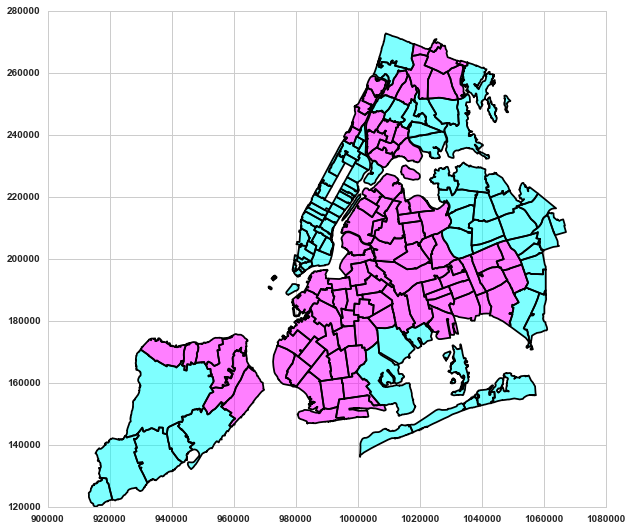

In [117]:
plt.figure(figsize=(10,10))
zipshpmerge.plot(column='Serious Lead Risk',colormap='cool')

In [121]:
#If we convert our coordinate system from US feet to lat/lon, we can use leaflet to create an interactive plot
print zipshpmerge.crs

None


In [122]:
#To convert CRS, we need to use fiona
import mplleaflet 
import fiona
print zipshpmerge.crs
zipshpmerge.crs = fiona.crs.from_epsg(2263) #EPSG=2263 is US feet
print zipshpmerge.crs

None
{'init': 'epsg:2263', 'no_defs': True}


In [123]:
zipshpmerge = zipshpmerge.to_crs(epsg=4326) #EPSG=4326 is lat/lon

In [125]:
#Now import mplleaflet to convert a matplotlib object to leaflet html

plt.figure(figsize=(10,10))
ax = zipshpmerge.plot(column='Predicted SLR',colormap='cool',alpha=1)
mplleaflet.display(fig=ax.figure)

# How does NYC compare to the rest of New York State?
New York seems to have many neighbourhoods that are at risk of Environmental Intervention levels of childhood
lead poisoning. But, how bed is NYC relative to the rest of the state. Is it better or worse? Let's compare to these results to New York State and see if we can also generate a prediction of New York State county-level lead poisoning risk.

In [211]:
#Let's extract the NYC county-level BLL data to add to our complimentary New York state county-level analysis
BLLdataBronx = BLLdata[BLLdata['Neighborhood'].str.contains("BX")==True]
BLLdataQueens = BLLdata[BLLdata['Neighborhood'].str.contains("Q")==True]
BLLdataNY = BLLdata[BLLdata['Neighborhood'].str.contains("M")==True]
BLLdataKings = BLLdata[BLLdata['Neighborhood'].str.contains("BK")==True]
BLLdataRichmond = BLLdata[BLLdata['Neighborhood'].str.contains("S")==True]

In [212]:
#We want to sum the BLL cases for all the neighbourhoods within each county (note that we only want one value for 
#BX1, one for BX2, etc.)

#If we remove the "ZipCode" column, we can use .drop_duplicates to get our single neighbourhoods
del BLLdataBronx['ZipCode']
del BLLdataQueens['ZipCode']
del BLLdataNY['ZipCode']
del BLLdataKings['ZipCode']
del BLLdataRichmond['ZipCode']

BLLdataBronx= BLLdataBronx.drop_duplicates().reset_index(drop=True)
BLLdataQueens = BLLdataQueens.drop_duplicates().reset_index(drop=True)
BLLdataNY = BLLdataNY.drop_duplicates().reset_index(drop=True)
BLLdataKings = BLLdataKings.drop_duplicates().reset_index(drop=True)
BLLdataRichmond = BLLdataRichmond.drop_duplicates().reset_index(drop=True)

In [186]:
#Sum all the New Cases in 2012 and EIBLL Cases to compare to NY State Counties

############ REWRITE AS FUNCTIONS!!! #####################
##########################################################

BLLBronx2012 = BLLdataBronx['New Cases (2012)'].sum()
BLLQueens2012 = BLLdataQueens['New Cases (2012)'].sum()
BLLNY2012 = BLLdataNY['New Cases (2012)'].sum()
BLLKings2012 = BLLdataKings['New Cases (2012)'].sum()
BLLRichmond2012 = BLLdataRichmond['New Cases (2012)'].sum()

BLLBronxEIBLL = BLLdataBronx['EIBLL Cases (2010-2012)'].sum()
BLLQueensEIBLL = BLLdataQueens['EIBLL Cases (2010-2012)'].sum()
BLLNYEIBLL = BLLdataNY['EIBLL Cases (2010-2012)'].sum()
BLLKingsEIBLL = BLLdataKings['EIBLL Cases (2010-2012)'].sum()
BLLRichmondEIBLL = BLLdataRichmond['EIBLL Cases (2010-2012)'].sum()

In [188]:
#What we really want is the rate, so we need to figure out how many children were tested and then 
#recalculate the BLL and EIBLL case rates (in per 1000 tested)

#Calculate how many children were tested
BLLBronx2012Tested = BLLdataBronx['New Cases (2012)'] * 1000 / BLLdataBronx['New Rate (2012)']
BLLQueens2012Tested = BLLdataQueens['New Cases (2012)'] * 1000 / BLLdataQueens['New Rate (2012)']
BLLNY2012Tested = BLLdataNY['New Cases (2012)'] * 1000 / BLLdataNY['New Rate (2012)']
BLLKings2012Tested = BLLdataKings['New Cases (2012)'] * 1000 / BLLdataKings['New Rate (2012)']
BLLRichmond2012Tested = BLLdataRichmond['New Cases (2012)'] * 1000 / BLLdataRichmond['New Rate (2012)']

BLLBronxEIBLLTested = BLLdataBronx['EIBLL Cases (2010-2012)'] * 1000 / BLLdataBronx['EIBLL Rate (2010-2012)']
BLLQueensEIBLLTested = BLLdataQueens['EIBLL Cases (2010-2012)'] * 1000 / BLLdataQueens['EIBLL Rate (2010-2012)']
BLLNYEIBLLTested = BLLdataNY['EIBLL Cases (2010-2012)'] * 1000 / BLLdataNY['EIBLL Rate (2010-2012)']
BLLKingsEIBLLTested = BLLdataKings['EIBLL Cases (2010-2012)'] * 1000 / BLLdataKings['EIBLL Rate (2010-2012)']
BLLRichmondEIBLLTested = BLLdataRichmond['EIBLL Cases (2010-2012)'] * 1000 / BLLdataRichmond['EIBLL Rate (2010-2012)']

In [189]:
#Calculate the BLL and EIBLL case rates for each NYC county
BLLBronx2012Rate = BLLBronx2012 * 1000 / BLLBronx2012Tested.sum()
BLLQueens2012Rate = BLLQueens2012 * 1000 / BLLQueens2012Tested.sum()
BLLNY2012Rate = BLLNY2012 * 1000 / BLLNY2012Tested.sum()
BLLKings2012Rate = BLLKings2012 * 1000 / BLLKings2012Tested.sum()
BLLRichmond2012Rate = BLLRichmond2012 * 1000 / BLLRichmond2012Tested.sum()

BLLBronxEIBLLRate = BLLBronxEIBLL * 1000 / BLLBronxEIBLLTested.sum()
BLLQueensEIBLLRate = BLLQueensEIBLL * 1000 / BLLQueensEIBLLTested.sum()
BLLNYEIBLLRate = BLLNYEIBLL * 1000 / BLLNYEIBLLTested.sum()
BLLKingsEIBLLRate = BLLKingsEIBLL * 1000 / BLLKingsEIBLLTested.sum()
BLLRichmondEIBLLRate = BLLRichmondEIBLL * 1000 / BLLRichmondEIBLLTested.sum()

In [190]:
#Put all this NYC county-level data into a dataframe
NYC_counties = {"County": ("Bronx", "Kings","New York", "Queens","Richmond"),\
                "Tests (2012)": (BLLBronx2012Tested.sum(),BLLKings2012Tested.sum(),BLLNY2012Tested.sum(),BLLQueens2012Tested.sum(),BLLRichmond2012Tested.sum()),\
                "New Cases (2012)": (BLLBronx2012,BLLKings2012,BLLNY2012,BLLQueens2012,BLLRichmond2012),\
                "New Rate (2012)":(BLLBronx2012Rate,BLLKings2012Rate,BLLNY2012Rate,BLLQueens2012Rate,BLLRichmond2012Rate),\
                "EIBLL Cases (2010-2012)": (BLLBronxEIBLL,BLLKingsEIBLL,BLLNYEIBLL,BLLQueensEIBLL,BLLRichmondEIBLL),\
                "EIBLL Rate (2010-2012)":(BLLBronxEIBLLRate,BLLKingsEIBLLRate,BLLNYEIBLLRate,BLLQueensEIBLLRate,BLLRichmondEIBLLRate)}

In [191]:
NYC_countiesdf = pd.DataFrame(data=NYC_counties)

In [192]:
NYC_countiesdf.head()

,County,EIBLL Cases (2010-2012),EIBLL Rate (2010-2012),New Cases (2012),New Rate (2012),Tests (2012)
0,Bronx,239,0.946097,178,2.194807,81100.518044
1,Kings,495,1.133189,463,3.269552,141609.623086
2,New York,105,0.680948,97,1.952238,49686.574217
3,Queens,392,1.146645,264,2.343357,112658.902692
4,Richmond,37,0.683722,42,2.385489,17606.451613


In [196]:
#Save NYC county data to csv and use in NY State IPython Notebook
NYC_countiesdf.to_csv(rootpath + 'NYC_counties_BLL.csv')